* Goal : 
  * Code Goodwin spatial 1D
  * Explore a few patterns

In [1]:
import sys
sys.path.insert(0,  "../../" )
import chimes as chm

# Basic everyday packages
import pandas as pd
import matplotlib.pyplot as plt 
import plotly.graph_objects as go
import numpy as np
import plotly
import copy

# Improving display of tables
from IPython.display import display,HTML,Markdown
from IPython.display import IFrame
from itables import init_notebook_mode,options
options.columnDefs = [{"className": "dt-left", "targets": "_all"}]
options.classes="display nowrap compact"
options.scrollY="400px"
options.scrollCollapse=True
options.paging=False
pd.set_option('display.max_colwidth', None)
pd.set_option("display.colheader_justify","left")

# Interactive matplotlib figures, use plt.close('all') when too many are open
init_notebook_mode(all_interactive=True)
%matplotlib widget

## Tomas Mazak's workaround for Latex plotly rendering
import plotly.graph_objs as go
from IPython.display import display, HTML
plotly.offline.init_notebook_mode()
display(HTML('<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'))


<IPython.core.display.Javascript object>

In [4]:
4/153

0.026143790849673203

In [2]:
chm.create_models_readme('Goodwin_Spatial')

In [3]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def locplot(hub, title='', colormaps=None):
    R = hub.get_dfields()
    employment = R['employment']['value'][:, 0, :, 0]
    omega = R['omega']['value'][:, 0, :, 0]
    Y = R['Y']['value'][:, 0, :, 0]
    divPhiI = R['divPhiI']['value'][:, 0, :, 0]
    divPhiN = R['divPhiN']['value'][:, 0, :, 0]
    N = R['N']['value'][:, 0, :, 0]

    # Default colormaps if not provided
    if colormaps is None:
        colormaps = {
            'employment': 'viridis',
            'omega': 'plasma',
            'Y': 'inferno',
            'divPhiI': 'magma',
            'divPhiN': 'cividis'
        }

    gs = gridspec.GridSpec(2, 3, height_ratios=[1, 1])  # Equal height ratios for both rows
    fig = plt.figure(figsize=(12, 8))

    # First row of subplots
    # First subplot
    ax1 = plt.subplot(gs[0, 0])
    cax1 = ax1.pcolormesh(employment[:,:,0], cmap=colormaps['employment'])
    ax1.set_xlabel(r'$\lambda$')
    ax1.set_xticks([])
    plt.colorbar(cax1, ax=ax1, orientation='horizontal', fraction=0.046, pad=0.07)

    # Second subplot
    ax2 = plt.subplot(gs[0, 1])
    cax2 = ax2.pcolormesh(omega[:,:,0], cmap=colormaps['omega'])
    ax2.set_xlabel(r'$\omega$')
    ax2.set_yticks([])  # Remove y-ticks
    ax2.set_xticks([])
    plt.colorbar(cax2, ax=ax2, orientation='horizontal', fraction=0.046, pad=0.07)

    # Third subplot
    ax3 = plt.subplot(gs[0, 2])
    cax3 = ax3.pcolormesh(Y[:,:,0], cmap=colormaps['Y'])
    ax3.set_xlabel(r'$Y$')
    ax3.yaxis.set_ticks_position('right')  # Y-axis on the right
    ax3.set_xticks([])
    plt.colorbar(cax3, ax=ax3, orientation='horizontal', fraction=0.046, pad=0.07)

    # Second row of subplots
    # First subplot
    ax4 = plt.subplot(gs[1, 0])
    cax4 = ax4.pcolormesh(divPhiI[:,:,0], cmap=colormaps['divPhiI'])
    ax4.set_xlabel(r'$\vec{\nabla} \cdot \vec{\Phi_I}$')
    ax4.set_xticks([])
    plt.colorbar(cax4, ax=ax4, orientation='horizontal', fraction=0.046, pad=0.07)

    # Second subplot
    ax5 = plt.subplot(gs[1, 1])
    cax5 = ax5.pcolormesh(divPhiN[:,:,0], cmap=colormaps['divPhiN'])
    ax5.set_xlabel(r'$\vec{\nabla} \cdot \vec{\Phi_N}$')
    ax5.set_yticks([])  # Remove y-ticks
    ax5.set_xticks([])
    plt.colorbar(cax5, ax=ax5, orientation='horizontal', fraction=0.046, pad=0.07)

    # Third subplot
    ax6 = plt.subplot(gs[1, 2])
    cax6 = ax6.pcolormesh(N[:,:,0], cmap=colormaps['divPhiN'])
    ax6.set_xlabel(r'$N$')
    ax6.set_yticks([])  # Remove y-ticks
    ax6.set_xticks([])
    plt.colorbar(cax6, ax=ax6, orientation='horizontal', fraction=0.046, pad=0.07)

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()



In [ ]:
def WageHistogram(hub,
                  NormalizeWorkers=True,
                  Normalizew=True):
        
    # Fetch the data
    R = hub.get_dfields()
    w = R['w']['value'][:, 0, :, 0,0]
    L = R['L']['value'][:, 0, :, 0,0]
    Time = R['time']['value'][:, 0, 0, 0]

    mean_wages = np.sum(w,axis=1)*np.sum(L,axis=1)/np.sum(w*L,axis=1)
    Totalworkers = np.sum(L,axis=1)

    if NormalizeWorkers:
        L = L/Totalworkers[:, np.newaxis]
    #if Normalizew:
    #    w = w/mean_wages[:, np.newaxis]

    # Flatten the arrays for use in histogram2d
    w_flat = w.flatten()
    L_flat = L.flatten()
    time_flat = np.repeat(Time, w.shape[1])

    # Define the number of bins for the histogram
    # Use log-spaced bins for the wage axis
    w_bins = np.logspace(np.log10(w_flat.min()), np.log10(w_flat.max()), 50)
    time_bins = np.linspace(time_flat.min(), time_flat.max(), len(Time))

    # Create the 2D histogram using weights
    hist, xedges, yedges = np.histogram2d(w_flat, time_flat, bins=[w_bins, time_bins], weights=L_flat)

    # Mask zero values
    hist_masked = np.ma.masked_where(hist == 0, hist)
    mean_wages = np.zeros(len(Time))
    std_wages = np.zeros(len(Time))
    for i in range(len(Time)):
        mask = (time_flat == Time[i])
        mean_wages[i] = np.sum(w_flat[mask] * L_flat[mask]) / np.sum(L_flat[mask])
        variance = np.sum(L_flat[mask] * (w_flat[mask] - mean_wages[i])**2) / np.sum(L_flat[mask])
        std_wages[i] = np.sqrt(variance)

    # Plotting the 2D histogram with semilog scale for x-axis
    fig, ax = plt.subplots(figsize=(10, 6))
    cmap = plt.cm.hot_r
    cmap.set_bad(color='white')  # Set color for zero values
    mesh = ax.pcolormesh(w_bins, time_bins, hist_masked.T, cmap=cmap)
    fig.colorbar(mesh, label='Population count')

    plt.plot(mean_wages, Time, color='blue', label='Mean Wage Level', linewidth=2)
    plt.plot(mean_wages + std_wages, Time, color='blue', linestyle='--', linewidth=1)
    plt.plot(mean_wages - std_wages, Time, color='blue', linestyle='--', linewidth=1)


    ax.set_xscale('log')  # Set logarithmic scale for x-axis
    ax.set_xlabel('Log(Normalized Wage level)')
    ax.set_ylabel('Time')
    ax.set_title('Evolution of wage repartition over time')

    plt.show()

In [15]:
def lineevolv(hub):
    R = hub.get_dfields()
    t = R['time']['value'][:,0,0,0]
    Nt = len(t)
    X = R['employment']['value'][:,0,:,0,0]
    Y = R['omega']['value'][:,0,:,0,0]
    Nr = len(X[0,:])
    fig = go.Figure()

    mini = np.min([np.min(X), np.min(Y)])
    maxi = np.max([np.max(X), np.max(Y)])

    # Add traces for X and Y
    fig.add_trace(go.Scatter(x=np.arange(Nr), y=X[0], mode='lines', name='employment'))
    fig.add_trace(go.Scatter(x=np.arange(Nr), y=Y[0], mode='lines', name='omega'))

    # Define the frames for animation
    frames = []
    for t in range(Nt):
        frames.append(go.Frame(data=[
            go.Scatter(y=X[t]),
            go.Scatter(y=Y[t])
        ], name=str(t)))

    fig.frames = frames

    # Define the layout with slider
    layout = go.Layout(
        title='Animated Plot with Time Slider',
        xaxis=dict(title='Spatial Index'),
        yaxis=dict(title='Value', range=[mini, maxi]),
        updatemenus=[{
            'buttons': [
                {
                    'args': [None, {'frame': {'duration': 100, 'redraw': True}, 'fromcurrent': True}],
                    'label': 'Play',
                    'method': 'animate'
                },
                {
                    'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                    'label': 'Pause',
                    'method': 'animate'
                }
            ],
            'direction': 'left',
            'pad': {'r': 10, 't': 87},
            'showactive': False,
            'type': 'buttons',
            'x': 0.1,
            'xanchor': 'right',
            'y': 0,
            'yanchor': 'top'
        }],
        sliders=[{
            'active': 0,
            'yanchor': 'top',
            'xanchor': 'left',
            'currentvalue': {
                'font': {'size': 20},
                'prefix': 'Time:',
                'visible': True,
                'xanchor': 'right'
            },
            'transition': {'duration': 300, 'easing': 'cubic-in-out'},
            'pad': {'b': 10, 't': 50},
            'len': 0.9,
            'x': 0.1,
            'y': 0,
            'steps': [{
                'args': [
                    [str(k)],
                    {'frame': {'duration': 300, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 300}}
                ],
                'label': str(k),
                'method': 'animate'
            } for k in range(Nt)]
        }]
    )

    fig.update_layout(layout)
    fig.show()

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors

def Aggregate(hub,title=''):
        
    R = hub.get_dfields()
    t = R['time']['value'][:,0,0,0]
    employment = np.sum(R['L']['value'][:, 0, :, 0], axis=1) / np.sum(R['N']['value'][:, 0, :, 0], axis=1)
    omega = np.sum(R['w']['value'][:, 0, :, 0] * R['L']['value'][:, 0, :, 0], axis=1) / np.sum(R['Y']['value'][:, 0, :, 0], axis=1)

    # Prepare data for LineCollection
    points = np.array([employment, omega]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    # Create a figure and axis
    fig, ax = plt.subplots()
    norm = plt.Normalize(t.min(), t.max())
    lc = LineCollection(segments, cmap='viridis', norm=norm)
    lc.set_array(t)
    lc.set_linewidth(2)

    # Add the LineCollection to the plot
    line = ax.add_collection(lc)

    # Add a colorbar
    cbar = fig.colorbar(line, ax=ax)
    cbar.set_label('Time')

    # Set labels
    ax.set_xlabel('Aggregated employment')
    ax.set_ylabel('Aggregated wage share')

    # Set limits for better visualization
    ax.set_xlim(employment.min(), employment.max())
    ax.set_ylim(omega.min(), omega.max())

    # Show the plot
    plt.show()

In [6]:
from matplotlib.collections import LineCollection

def multiosc(hub,title=''):
    R = hub.get_dfields()
    employment = R['employment']['value'][:, 0, :, 0,0]
    omega = R['omega']['value'][:, 0, :, 0,0]
    Y = R['Y']['value'][:, 0, :, 0,0]
    t = R['time']['value'][:,0,0,0,0]
    
    xm = np.min(omega)
    xM = np.max(omega)
    ym = np.min(employment)
    yM = np.max(employment)
    
    plt.figure('')
    plt.suptitle(title)
    dax = {}
    Nosc = 9
    for i,idx in enumerate(np.linspace(0,len(employment[0,:])-1,9)):
        idx=int(idx)
        dax[i] = plt.subplot(3,3,i+1)
        
        xval = omega[:,idx]
        yval = employment[:,idx]
        points = np.array([xval, yval]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        norm = plt.Normalize(t.min(), t.max())
        lc = LineCollection(segments, cmap='viridis', norm=norm)
        lc.set_array(t)
        lc.set_linewidth(2)
        line = dax[i].add_collection(lc)  
         
        #plt.plot(omega[:,idx],employment[:,idx],c='b')
        #plt.plot(omega[0,idx],employment[0,idx],'*',c='k')
        plt.title(idx)
        plt.xlim([xm,xM])
        plt.ylim([ym,yM]) 
        plt.xticks([])
        plt.yticks([])
    plt.show()

In [7]:

def create_nabla(Nr):
    nabla = np.zeros((Nr, Nr))
    
    i = np.arange(Nr)
    nabla[i, (i + 1) % Nr] = 8.0 / 12.0
    nabla[i, (i - 1) % Nr] = -8.0 / 12.0
    nabla[i, (i + 2) % Nr] = -1.0 / 12.0
    nabla[i, (i - 2) % Nr] = 1.0 / 12.0
    
    nabla = nabla[np.newaxis, :, :, np.newaxis]
    return nabla

def create_laplacian(Nr):
    laplacian = np.zeros((Nr, Nr))
    
    i = np.arange(Nr)
    laplacian[i, i] = -5.0 / 2.0  # Diagonal elements
    laplacian[i, (i + 1) % Nr] = 4.0 / 3.0  # First off-diagonal elements
    laplacian[i, (i - 1) % Nr] = 4.0 / 3.0
    laplacian[i, (i + 2) % Nr] = -1.0 / 12.0  # Second off-diagonal elements
    laplacian[i, (i - 2) % Nr] = -1.0 / 12.0
    
    laplacian = laplacian[np.newaxis, :, :, np.newaxis]
    return laplacian


In [19]:
Nr = 100 
x = np.linspace(0,1,Nr)

noiseamp = 0.01

# Variation 
K = np.zeros(Nr)+2 
#K+= noiseamp*np.random.normal(size=Nr)
K[ int(Nr/3)]=2.5
K = K[np.newaxis, :, np.newaxis, np.newaxis]


N = np.zeros(Nr)+1 
N+= noiseamp*np.random.normal(size=Nr)
#N[ int(2*Nr/3)]=1.1
N = N[np.newaxis, :, np.newaxis, np.newaxis]

#### NABLA MATRIX ####
nabla = np.zeros((Nr, Nr))
nabla[(np.arange(Nr))     %Nr, (np.arange(Nr) + 1) %Nr] = 1 / 2
nabla[(np.arange(Nr) + 1) %Nr, (np.arange(Nr))     %Nr] = -1 / 2
nabla = nabla[np.newaxis, :, :, np.newaxis]



nabla = create_nabla(Nr)/10
laplacian = create_laplacian(Nr)/10
#### LAPLACIAN ####
#laplacian = np.zeros((Nr, Nr)) # Create the Laplacian matrix (second derivative)
#laplacian[np.arange(Nr), np.arange(Nr)] = -2 # Diagonal elements (second derivative)
#laplacian[(np.arange(Nr )    ) % Nr,( np.arange(Nr ) + 1) % Nr] = 1 # Off-diagonal elements (first derivative squared)
#laplacian[(np.arange(Nr ) + 1) % Nr,( np.arange(Nr ))% Nr] = 1
#laplacian = laplacian[np.newaxis, :, :, np.newaxis] # Reshape to match your specific dimensions

time step 4000 / 4000


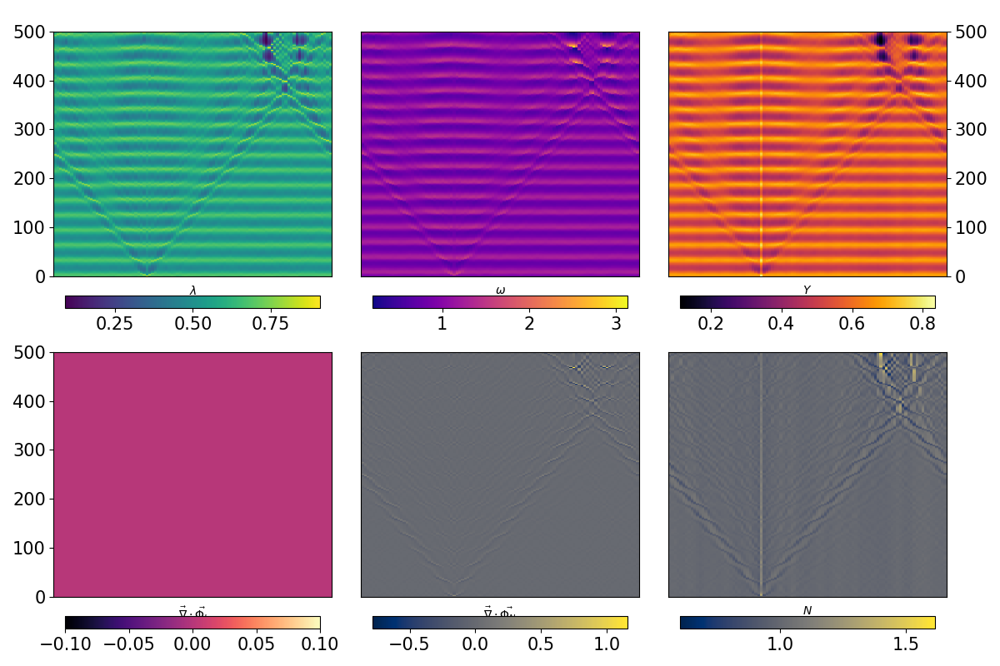

C:\Users\Paul Valcke\AppData\Local\Temp\ipykernel_27716\2444509177.py:21: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



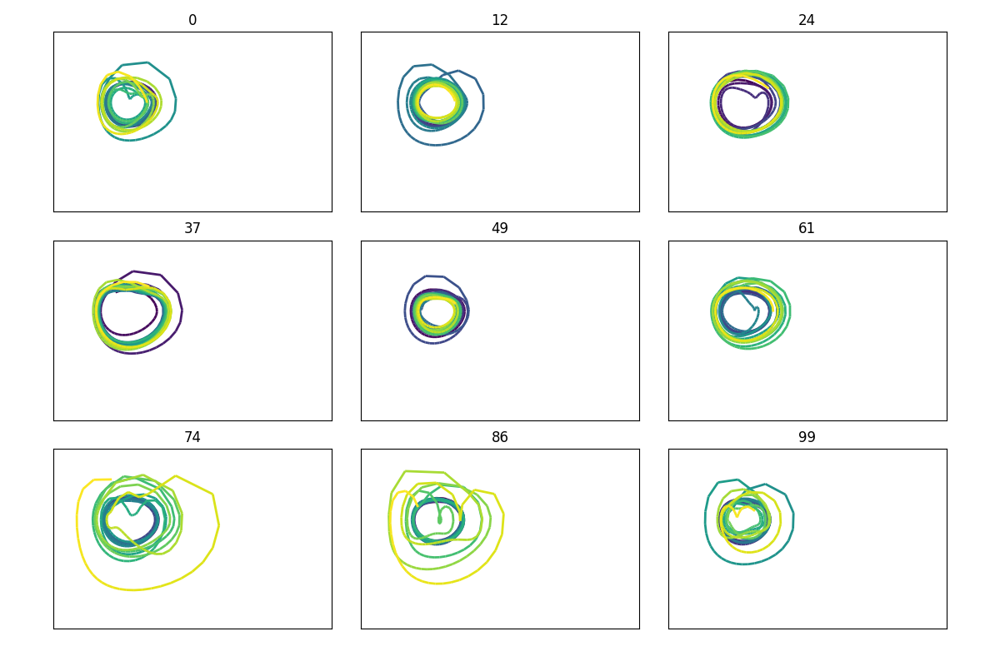

In [22]:
plt.close('all')
hub=chm.Hub('Goodwin_Spatial')
hub.set_fields(
    # Initial conditions 
    K = K,
    N = N,
    
    # Operators 
    nr=Nr,
    Nabla=nabla,
    Laplacian=laplacian,
    
    # Numerical timestep
    Tsim=200,
    dt=0.05,
    
    alpha = 0,
    n =0,
    
    # Spatial parameters
    Di=5,
    Dn=0,           
    #mupi=1.5,
    mulambda = 0.5,
    #muw = 1,
    #Dn=0.1
) 
hub.run(NtimeOutput=500)

locplot(hub, title='')
multiosc(hub)
#Aggregate(hub,title='Diffuse')
lineevolv(hub)


In [ ]:
WageHistogram(hub,
              NormalizeWorkers = True,
              Normalizew = True, 
              )